<a href="https://colab.research.google.com/github/sofiafopi/Topicos/blob/main/Bono1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [5]:
import pandas as pd
import io
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.stats import norm
import matplotlib.pyplot as plt
from scipy.stats import shapiro
import plotly.express as px
from scipy.stats import skew, kurtosis
from sklearn.linear_model import LinearRegression
from scipy.stats import spearmanr, kendalltau

In [2]:
from google.colab import files # Cargamos la base de datos en Google Colab, previamente descargada
uploaded = files.upload()

Saving asriosgu_nac2020.csv to asriosgu_nac2020.csv


In [6]:
io_csv = io.BytesIO(uploaded['asriosgu_nac2020.csv']) #Decimos que el archivo es csv
tabla = pd.read_csv(io_csv, sep = ",", index_col=0, encoding='latin-1')
tabla.head(5)

,COD_MUNIC,AREANAC,SIT_PARTO,OTRO_SIT,SEXO,PESO_NAC,TALLA_NAC,ANO,MES,ATEN_PAR,...,AREA_RES,N_HIJOSV,FECHA_NACM,N_EMB,SEG_SOCIAL,IDCLASADMI,EDAD_PADRE,NIV_EDUP,ULTCURPAD,PROFESION
COD_DPTO,,,,,,,,,,,,,,,,,,,,,
44,560,3,2,NaN,2,9,9,2020,11,5,...,3.0,1,NaN,1,2,2.0,20,99,99,5
44,560,3,2,NaN,1,9,9,2020,10,5,...,3.0,1,NaN,1,2,2.0,20,99,99,5
44,560,3,2,NaN,1,9,9,2020,10,5,...,3.0,1,NaN,1,2,2.0,20,99,99,5
44,560,3,2,NaN,2,9,9,2020,4,5,...,3.0,1,NaN,1,2,2.0,20,99,99,5
44,560,3,2,NaN,2,9,9,2020,8,5,...,3.0,1,NaN,1,2,2.0,20,99,99,5


In [7]:
df = tabla[["EDAD_PADRE", "EDAD_MADRE", "N_EMB"]] #Hacemos un subtabla de la tabla principal
df.head(5)

,EDAD_PADRE,EDAD_MADRE,N_EMB
COD_DPTO,,,
44,20,4,1
44,20,4,1
44,20,5,1
44,20,5,1
44,20,3,1


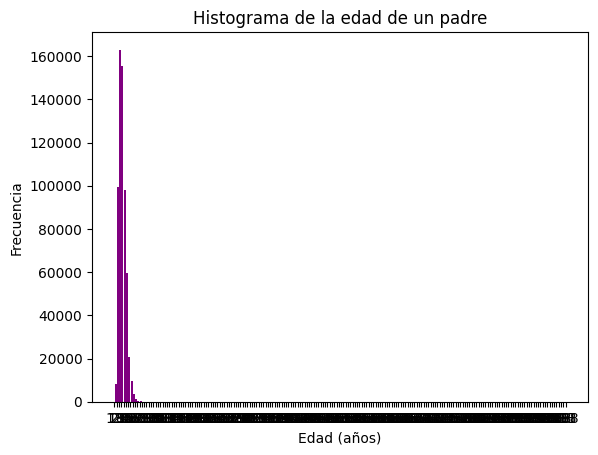

In [8]:
intervalos = range(min(df.EDAD_PADRE), max(df.EDAD_PADRE) + 1, 5) #Intervalos del histograma
#Contruirmos el histograma
plt.hist(df.EDAD_PADRE, bins=intervalos, color='purple', rwidth=0.85)
plt.title('Histograma de la edad de un padre')
plt.xlabel('Edad (años)')
plt.ylabel('Frecuencia')
plt.xticks(intervalos)
plt.show()

In [9]:
df1 = df[(df.EDAD_PADRE < 120) & (df.EDAD_MADRE != 99) & (df.N_EMB != 99)]
#Quitamos los datos innecesarios
df1.head(5)

,EDAD_PADRE,EDAD_MADRE,N_EMB
COD_DPTO,,,
44,20,4,1
44,20,4,1
44,20,5,1
44,20,5,1
44,20,3,1


<ipython-input-10-0dd6b3ad1401>:9: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k" (-> color=(0.0, 0.0, 0.0, 1)). The keyword argument will take precedence.
  plt.plot(x, p, 'k', linewidth=2, label='Distribución Normal', color = "green")


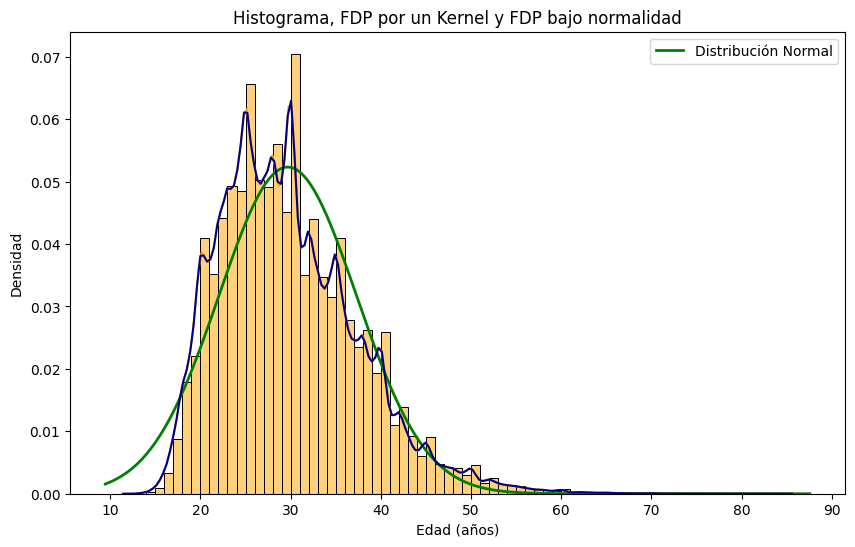

In [10]:
intervalos1 = range(min(df1.EDAD_PADRE), max(df1.EDAD_PADRE) + 1)#Nuevo intervalo
plt.figure(figsize=(10, 6))
#Nuevo histograma quitando datos inecesarios
sns.histplot(x = df1.EDAD_PADRE, bins = intervalos1, kde = True, stat = "density", color = "orange", edgecolor='black')
# kde = True es la gráfica de la función de densidad de probabilidad estimada por un método Kernell
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 1000)
p = norm.pdf(x, np.mean(df1.EDAD_PADRE), np.std(df1.EDAD_PADRE))
plt.plot(x, p, 'k', linewidth=2, label='Distribución Normal', color = "green")
sns.kdeplot(x=df1.EDAD_PADRE, color = "darkblue")
plt.title('Histograma, FDP por un Kernel y FDP bajo normalidad')
plt.xlabel('Edad (años)')
plt.ylabel('Densidad')
plt.legend()
plt.show()

Sea $X:=$ Edad del padre de un recién nacido en Colombia.

Descriptivamente como la función de densidad de probabilidad de los datos estimada por un método Kernel (línea azul) no coincide con la función de densidad de probabilidad asumiendo el supuesto de normalidad (línea verde),
$X\sim \text{Normal} (\text{Media} = \bar{x}, \text{Varianza} = S_x ^2),$ entonces no asumimos normalidad

In [11]:
shapiro(df1.EDAD_PADRE) #Prueba de Shapiro

/usr/local/lib/python3.10/dist-packages/scipy/stats/_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


ShapiroResult(statistic=0.958814799785614, pvalue=0.0)

Como el **valor p** es menor que 0.05 se rechaza que la variable aleatoria de la edad de un padre de un recién nacido en Colombia presenta distribución normal.

In [12]:
df1.EDAD_PADRE.count() #Para ver cuantos datos tenemos.
len(df1.EDAD_PADRE)

619932

In [13]:
idx = np.random.randint(len(df1.EDAD_PADRE), size = 100) #Tomamos una muestra de nuestro conjunto de datos, aproximando a números enteros
shapiro(df1.EDAD_PADRE.index[idx]) #Prueba de Shapiro mediante los indices

ShapiroResult(statistic=0.8735764026641846, pvalue=9.799706646163031e-08)

Como el valor p (igual a $9.799706646163031 * 10^{-8}$) es menor que 0.05, entonces se rechaza que la variable aleatoria de la edad de un padre de un recién nacido en Colombia presenta distribución normal

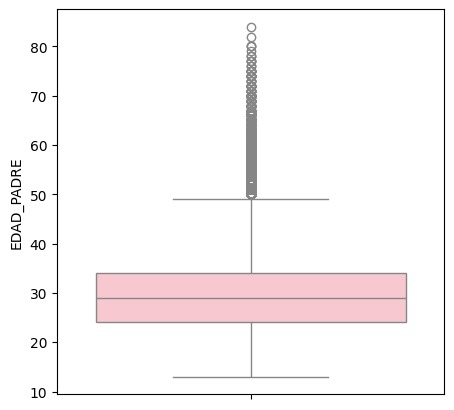

In [14]:
plt.figure(figsize=(5, 5)) #Diagrama de cajas y bigotes
sns.boxplot(df1.EDAD_PADRE, color='pink', saturation=0.75)
plt.show()

Se considera que la edad de un padre de un recién nacido en Colombia es atípica si es mayor que 50 años. El primer cuartil es aproximadamente 25 años, la media aritmética es aproximadamente 29 años y el tercer cuartil es aproximadamente 35 años.

**Rango intercuartílico = Tercer cuartil - Primer cuartil = 35-25 = 10**

In [15]:
plt.figure(figsize=(5, 5)) #Diagrama de puntos
fig = px.strip(df1.EDAD_PADRE, orientation = 'h')
fig.show()

<Figure size 500x500 with 0 Axes>


De acuerdo con el diagrama de puntos se observa una alta variabilidad de la edad de un padre de un recién Nacido en Colombia.

In [16]:
print(f"Media: {np.mean(df1.EDAD_PADRE)}")
print(f"Varianza {np.var(df1.EDAD_PADRE)} y la desviación estándar es de {np.std(df1.EDAD_PADRE)}")
print(f"Asimetría: {skew(df1.EDAD_PADRE)}")
print(f"Curtosis: {kurtosis(df1.EDAD_PADRE)}")

Media: 29.67728396017628
Varianza 58.13749376325272 y la desviación estándar es de 7.624794670235568
Asimetría: 0.8353050307248143
Curtosis: 0.9739372918657319


*   Aproximadamente el promedio de la edad de un padre de un recién nacido en Colombia es de 29.7 años.
*   Aproximadamente la distancia entre los valores de la edad edad un padre de un recién nacido en Colombia y la media es de 7.62 años.
*  La distribución de la edad de un padre de un recién nacido en Colombia es asimétrica positiva, es decir, la media es mayor que la moda de la variable aleatoria.
*  La distribución es platicúrtica, es decir, hay una baja concentración de las edades de un padre de un recién nacido en Colombia con respecto a la media.


**Diagrama de dispersión y la recta de regresión para datos bivariados.**

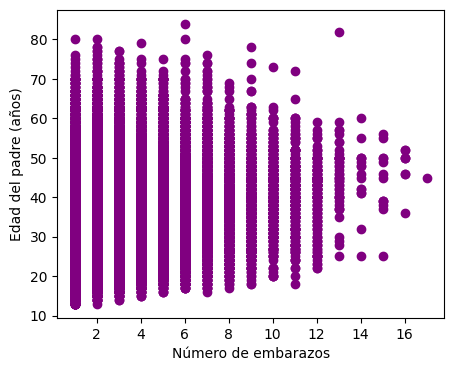

In [18]:
plt.figure(figsize=(5, 4))
plt.scatter(df1["N_EMB"], df1["EDAD_PADRE"], color = "purple", marker = "o")
plt.xlabel('Número de embarazos')
plt.ylabel('Edad del padre (años)')
plt.show()

Se observa en el diagrama de dispersión una nube de puntos sin un patrón particular, esto quiere decir que el número de embarazos y la edad de un padre en Colombia no están correlacionadas.

In [20]:
modelo = LinearRegression()
modelo.fit(np.array(df1.N_EMB).reshape(-1, 1), np.array(df1["EDAD_PADRE"]).reshape(-1, 1))
predi_lineal = modelo.predict(np.array(df1.N_EMB).reshape(-1, 1))
predi_lineal

array([[27.43380069],
       [27.43380069],
       [27.43380069],
       ...,
       [29.469573  ],
       [27.43380069],
       [27.43380069]])

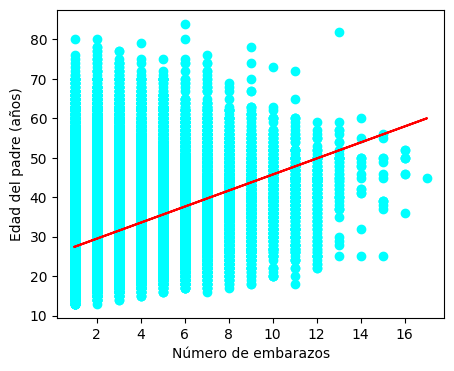

In [21]:
plt.figure(figsize=(5, 4))
plt.scatter(df1["N_EMB"], df1["EDAD_PADRE"], color = "cyan", marker = "o")
plt.plot(df1["N_EMB"], predi_lineal, linestyle='-', color = "red")
plt.xlabel('Número de embarazos')
plt.ylabel('Edad del padre (años)')
plt.show()

De acuerdo con la recta de regresión se determina una correlación positiva, es decir que entre más número de embarazos en Colombia, más años tiene el padre.

In [22]:
coef_pearson = np.corrcoef(df1["N_EMB"], df1["EDAD_PADRE"])[0, 1]
coef_spearman, _ = spearmanr(df1["N_EMB"], df1["EDAD_PADRE"])
coef_kendall, _ = kendalltau(df1["N_EMB"], df1["EDAD_PADRE"])
print(f"Los coeficientes de correlación de Pearson, Spearman y Kendall son respectivamente {coef_pearson}, {coef_spearman} y {coef_kendall}.")


Los coeficientes de correlación de Pearson, Spearman y Kendall son respectivamente 0.3530857510781986, 0.37998015979212696 y 0.29695921176068596.


De acuerdo con los coeficientes de correlación de Pearson, de Kendall y de Spearman se determina que el número de hijos de un padre y la edad de un padre de un recién nacido en Colombia están discretamente correlacionadas. Según la interpretación de los coeficientes de correlacion de la referencia: Landis, J. R., & Koch, G. G. (1977). The measurement of observer agreement for categorical data. biometrics, 159-174, dada por el profesor.